In [1]:
import pandas as pd
import numpy as np
import re
import random
import itertools
import ast
from statistics import mode
import seaborn as sns
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.stats import chi2_contingency, f_oneway, fisher_exact
import os, glob
import sys
import pickle
from tqdm import tqdm
import statsmodels.stats.multitest as smm

plt.rcParams["font.family"] = "Arial"
mpl.rcParams['figure.dpi'] = 900

import warnings
warnings.filterwarnings("ignore")

# Read in the data

In [2]:
mturkId_to_playerId_mapping = pd.read_csv('../../outputs/processed_data/players.csv')[['playerId', 'urlParams']]
pattern = re.compile(r'"workerId":"([^"]+)"')
mturkId_to_playerId_mapping['mturkId'] = mturkId_to_playerId_mapping['urlParams'].apply(
    lambda x: pattern.search(x).group(1) if isinstance(x, str) and pattern.search(x) else None
)

In [3]:
# get the original panel data and pull out the workers
df_panel = pd.read_csv('../../data/players/individuals.csv')

In [4]:
mturkId_to_panel_info = mturkId_to_playerId_mapping.merge(df_panel, left_on='mturkId', right_on='WorkerId', how='left')

In [5]:
# get the original panel data and pull out the workers
df_player_rounds = pd.read_csv('../../outputs/processed_data/player_rounds.csv')

In [6]:
df_player_rounds_with_panel_info = df_player_rounds.merge(
    mturkId_to_panel_info,
    on="playerId",
    how="left"
)

In [7]:
df_num_players = df_player_rounds.groupby('roundId').size().reset_index(name='playerCount')
df_num_players_with_demographics = df_num_players.merge(df_player_rounds_with_panel_info, on='roundId', how='left')

In [8]:
FOCAL_DEMOGRAPHIC_COLS = ['IRCS_GS', 'IRCS_GV', 'IRCS_IB', 'IRCS_IR', 'IRCS_IV', 'IRCS_RS',
						'RME', 'CRT', 'birth_year', 'education_level', 'income_max', 'political_fiscal', 'political_party', 'political_social',
						'gender', 'race', 'marital_status']

df_demographics = df_num_players_with_demographics.groupby('playerId')[FOCAL_DEMOGRAPHIC_COLS + ["playerCount"]].agg(lambda x: mode(x.dropna()) if len(x.dropna()) > 0 else np.nan).reset_index()

functions to clean up the demographics

In [9]:
# first, we need to code things properly
# consolidate race so that categories with less than 200 individuals becomes 'other'
def consolidate_race_categories(df, column, threshold=200):
	counts = df[column].value_counts()
	to_replace = counts[counts < threshold].index
	df[column] = df[column].replace(to_replace, 'Other')
	return df

# identify cases where people put an abnormally small number for birth year; they likely put their actual age, so subtract by 2024
def transform_birth_year(df, column='birth_year'):
	condition = df[column] < 250
	df.loc[condition, column] = 2024 - df.loc[condition, column]
	# filter out birth years that are too young (greater than 2024-18)
	df = df[df[column] <= 2006]
	# filter out birth years that are too old (less than 1920)
	df = df[df[column] >= 1920]
	return df

In [10]:
df_demographics = consolidate_race_categories(df_demographics, "race")
df_demographics = transform_birth_year(df_demographics, "birth_year")

In [11]:
# encode `gender` and `race` columns as factors with consistent ordering
gender_order = df_demographics['gender'].value_counts().index.tolist()
race_order = df_demographics['race'].value_counts().index.tolist()
education_level_order = df_demographics['education_level'].value_counts().index.tolist()
marital_status_order = df_demographics['marital_status'].value_counts().index.tolist()

df_demographics['gender'] = pd.Categorical(df_demographics['gender'], categories=gender_order, ordered=True)
df_demographics['race'] = pd.Categorical(df_demographics['race'], categories=race_order, ordered=True)
df_demographics['education_level'] = pd.Categorical(df_demographics['education_level'], categories=education_level_order, ordered=True)
df_demographics['marital_status'] = pd.Categorical(df_demographics['marital_status'], categories=marital_status_order, ordered=True)

In [12]:
# now filter out the people who didn't complete the task due to attrition
df_player_conditions = pd.read_csv('../../outputs/processed_data/player_conditions.csv')
df_player_conditions["exitStatus"].value_counts()

exitStatus
finished             1184
gameCancelled         209
custom                 81
cancelled              16
gameLobbyTimedOut       3
failed                  3
Name: count, dtype: int64

In [13]:
status_map = {
    "finished": "finished",
    "custom": "finished",
}

def group_exit_status(status: str) -> str:
    if pd.isna(status):
        return "unknown"
    return status_map.get(status, "not_finished")


df_player_conditions["exitStatus_grouped"] = df_player_conditions["exitStatus"].apply(group_exit_status)


In [14]:
# Get the contingency table
counts = df_player_conditions.groupby(["playerCount", "exitStatus_grouped"]).size().unstack(fill_value=0)
print(counts)

# print the proportions
print(counts.div(counts.sum(axis=1), axis=0))

# Overall chi-square
chi2, p, dof, expected = chi2_contingency(counts)
print(f"Overall Chi2 = {chi2:.3f}, df = {dof}, p = {p:.4f}")

# Pairwise tests
pairs = list(itertools.combinations([1, 3, 6], 2))
results = []

for g1, g2 in pairs:
    sub = counts.loc[[g1, g2]]
    
    # If any expected count < 5, use Fisher’s exact
    if (sub.values < 5).any():
        _, pval = fisher_exact(sub)
        test_type = "Fisher"
    else:
        _, pval, _, _ = chi2_contingency(sub)
        test_type = "Chi2"
        
    results.append((f"{g1} vs {g2}", test_type, pval))

# Adjust p-values
labels, tests, raw_pvals = zip(*results)
adj_pvals = smm.multipletests(raw_pvals, method="fdr_bh")[1]

# Show results
for label, test, raw, adj in zip(labels, tests, raw_pvals, adj_pvals):
    print(f"{label} ({test}): raw p = {raw:.4f}, adjusted p = {adj:.4f}")

exitStatus_grouped  finished  not_finished
playerCount                               
1                        185            45
3                        402            84
6                        678           102
exitStatus_grouped  finished  not_finished
playerCount                               
1                   0.804348      0.195652
3                   0.827160      0.172840
6                   0.869231      0.130769
Overall Chi2 = 7.599, df = 2, p = 0.0224
1 vs 3 (Chi2): raw p = 0.5238, adjusted p = 0.5238
1 vs 6 (Chi2): raw p = 0.0190, adjusted p = 0.0570
3 vs 6 (Chi2): raw p = 0.0483, adjusted p = 0.0725


In [15]:
df_player_conditions = df_player_conditions[(df_player_conditions["exitStatus"] == "finished")|(df_player_conditions["exitStatus"] == "custom")]

In [16]:
df_demographics = df_demographics[df_demographics['playerId'].isin(df_player_conditions['playerId'])]

In [17]:
# TODO: numbers are slight off relative to final data
df_demographics["playerCount"].value_counts()/df_demographics['playerCount'].value_counts().index

playerCount
6    112.500000
3    131.333333
1    175.000000
dtype: float64

In [18]:
def plot_demographic_distributions_with_stats(df: pd.DataFrame, FOCAL_DEMOGRAPHIC_COLS):
    def is_categorical(series):
        return pd.api.types.is_categorical_dtype(series) or series.dtype == object or series.nunique() < 10
    
    n = len(FOCAL_DEMOGRAPHIC_COLS)
    cols = 6
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    axes = axes.flatten()
    
    for ax, col in zip(axes, FOCAL_DEMOGRAPHIC_COLS):
        if is_categorical(df[col]):
            counts = df.groupby(["playerCount", col]).size().reset_index(name="count")
            totals = counts.groupby("playerCount")["count"].transform("sum")
            counts["proportion"] = counts["count"] / totals
            sns.barplot(
                data=counts, x=col, y="proportion", hue="playerCount",
                alpha=0.7, palette="Dark2", ax=ax
            )
            contingency = pd.crosstab(df[col], df["playerCount"])
            if contingency.shape[0] > 1 and contingency.shape[1] > 1:
                chi2, p, dof, ex = chi2_contingency(contingency)
            else:
                p = np.nan
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
        else:
            sns.histplot(
                data=df, x=col, hue="playerCount",
                element="step", stat="density", common_norm=False,
                alpha=0.4, palette="Dark2", ax=ax
            )
            groups = [group[col].dropna() for _, group in df.groupby("playerCount")]
            if all(len(g) > 1 for g in groups):
                stat, p = f_oneway(*groups)
            else:
                p = np.nan
        ax.set_title(f"{col}\n(p={p:.3g})", fontsize=18, fontweight="bold")
        ax.set_xlabel("")
    for j in range(len(FOCAL_DEMOGRAPHIC_COLS), len(axes)):
        axes[j].set_visible(False)
    plt.subplots_adjust(hspace=0.9, wspace=0.5)
    plt.savefig('../../outputs/figures/demographic_distributions_by_team_size.png', bbox_inches='tight')
    plt.show()

In [19]:
plot_demographic_distributions_with_stats(df_demographics, FOCAL_DEMOGRAPHIC_COLS)

# Team Composition Analysis

In [20]:
# observational data for TEAMS
team_multi_task_full = pd.read_csv('../../outputs/processed_data/observation_level_dv_with_composition.csv')

In [21]:
players_per_stage = team_multi_task_full[["stageId", "playerIds"]]

In [22]:
players_1 = pd.read_csv('../../data/players/players_wave1_epoch1.csv')
players_2 = pd.read_csv('../../data/players/players_wave1_epoch2.csv')
players_wave2 = pd.read_csv('../../data/players/players_wave_2.csv')
players_wave3 = pd.read_csv('../../data/players/players_wave_3.csv')

players = pd.concat([players_1, players_2, players_wave2, players_wave3])
player_workerIds = players[["_id", "id"]].dropna().rename(columns = {"_id": "playerId", "id": "WorkerId"})
# parse out the first part of WorkerId
player_workerIds["WorkerId"] = player_workerIds["WorkerId"].str.split(" ").str[0]

In [23]:
# match playerIds to players_per_stage based on whether data.playerIds CONTAINS the playerId
stage_id_to_player_and_worker = pd.DataFrame(columns=["stageId", "playerId", "WorkerId"])

# Use tqdm to create a progress bar for the loop
for player in tqdm(player_workerIds["playerId"], desc="Matching playerIds"):
	stages_played = players_per_stage[players_per_stage["playerIds"].str.contains(player)].copy()

	if len(stages_played) > 0:
		# Set "playerId" column to the player's id
		stages_played["playerId"] = player
		# Get workerId of player
		workerId = player_workerIds.loc[player_workerIds["playerId"] == player, "WorkerId"].values[0]
		# Set "WorkerId" column to the player's id
		stages_played["WorkerId"] = workerId
		new_player_rows = stages_played[["stageId", "playerId", "WorkerId"]]
		stage_id_to_player_and_worker = pd.concat([stage_id_to_player_and_worker, new_player_rows], axis=0)

Matching playerIds:   0%|                              | 0/2839 [00:00<?, ?it/s]

Matching playerIds:   7%|█▏                | 191/2839 [00:00<00:01, 1909.70it/s]

Matching playerIds:  13%|██▍               | 382/2839 [00:00<00:01, 1826.86it/s]

Matching playerIds:  20%|███▌              | 569/2839 [00:00<00:01, 1844.09it/s]

Matching playerIds:  27%|████▊             | 754/2839 [00:00<00:01, 1796.74it/s]

Matching playerIds:  33%|█████▉            | 934/2839 [00:00<00:01, 1779.19it/s]

Matching playerIds:  39%|██████▋          | 1121/2839 [00:00<00:00, 1806.90it/s]

Matching playerIds:  46%|███████▊         | 1314/2839 [00:00<00:00, 1845.59it/s]

Matching playerIds:  54%|█████████▏       | 1527/2839 [00:00<00:00, 1933.72it/s]

Matching playerIds:  61%|██████████▎      | 1721/2839 [00:00<00:00, 1789.22it/s]

Matching playerIds:  68%|███████████▍     | 1918/2839 [00:01<00:00, 1838.50it/s]

Matching playerIds:  74%|████████████▌    | 2104/2839 [00:01<00:00, 1734.14it/s]

Matching playerIds:  80%|█████████████▋   | 2280/2839 [00:01<00:00, 1707.80it/s]

Matching playerIds:  86%|██████████████▋  | 2453/2839 [00:01<00:00, 1646.14it/s]

Matching playerIds:  92%|███████████████▋ | 2619/2839 [00:01<00:00, 1576.28it/s]

Matching playerIds:  98%|████████████████▋| 2778/2839 [00:01<00:00, 1547.12it/s]

Matching playerIds: 100%|█████████████████| 2839/2839 [00:01<00:00, 1710.42it/s]

In [24]:
# heres the information we have about all the workers
panel = pd.read_csv('../../data/players/individuals.csv')

In [25]:
demographics = ['birth_year', 'education_level', 'income_max', 'political_fiscal', 'political_social', 'political_party', 'gender', 'race', 'marital_status']
DEMOGRAPHIC_COLS = [col for col in panel.columns if ('IRCS' in col or 'CRT' in col or 'RME' in col or col in demographics)]

In [26]:
panel_filtered = panel[["WorkerId"] + DEMOGRAPHIC_COLS]

In [27]:
individual_workers_by_stageId = pd.merge(left = stage_id_to_player_and_worker, right = panel_filtered, on = "WorkerId", how = "left")
composition_by_stageId = individual_workers_by_stageId[["stageId"] + list(individual_workers_by_stageId.select_dtypes(include=[np.number]).columns)].groupby("stageId").mean().reset_index()

In [28]:
# consolidate race so that categories with less than 200 individuals becomes 'other'
individual_workers_by_stageId = consolidate_race_categories(individual_workers_by_stageId, 'race')
# identify cases where people put an abnormally small number for birth year; they likely put their actual age, so subtract by 2024
individual_workers_by_stageId = transform_birth_year(individual_workers_by_stageId)

In [29]:
def plot_histograms(df, columns, titles, x_label="", y_label="Number of Participants", fig_path = None):
	num_plots = len(columns)
	num_rows = (num_plots + 2) // 3
	
	fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
	axes = axes.flatten() 
	
	colors = ["#6967A7", "#FFB862", "#D25218", "#67B7D6", "#E8A09A", "#8DD2B2"]
	
	for i, (column, title) in enumerate(zip(columns, titles)):
		ax = axes[i]
		
		if pd.api.types.is_numeric_dtype(df[column]):
			# Plot the histogram for numeric data
			ax.hist(df[column], bins=10, 
					color="#1C9E76", align='mid')
			
			# Calculate and plot mean line
			mean_value = df[column].mean()
			ax.axvline(mean_value, color='black', linestyle='dashed', linewidth=1)
		
		else:
			value_counts = df[column].value_counts()
			value_counts.plot(kind='bar', ax=ax, color=colors[:len(value_counts)])
		
		ax.set_title(title)
		ax.set_xlabel(x_label)
		ax.set_ylabel(y_label)
		ax.grid(False)
	
	for j in range(i + 1, num_rows * 3):
		fig.delaxes(axes[j])
	
	plt.tight_layout()
	if fig_path is not None:
		plt.savefig(fig_path, bbox_inches='tight')
	plt.show()

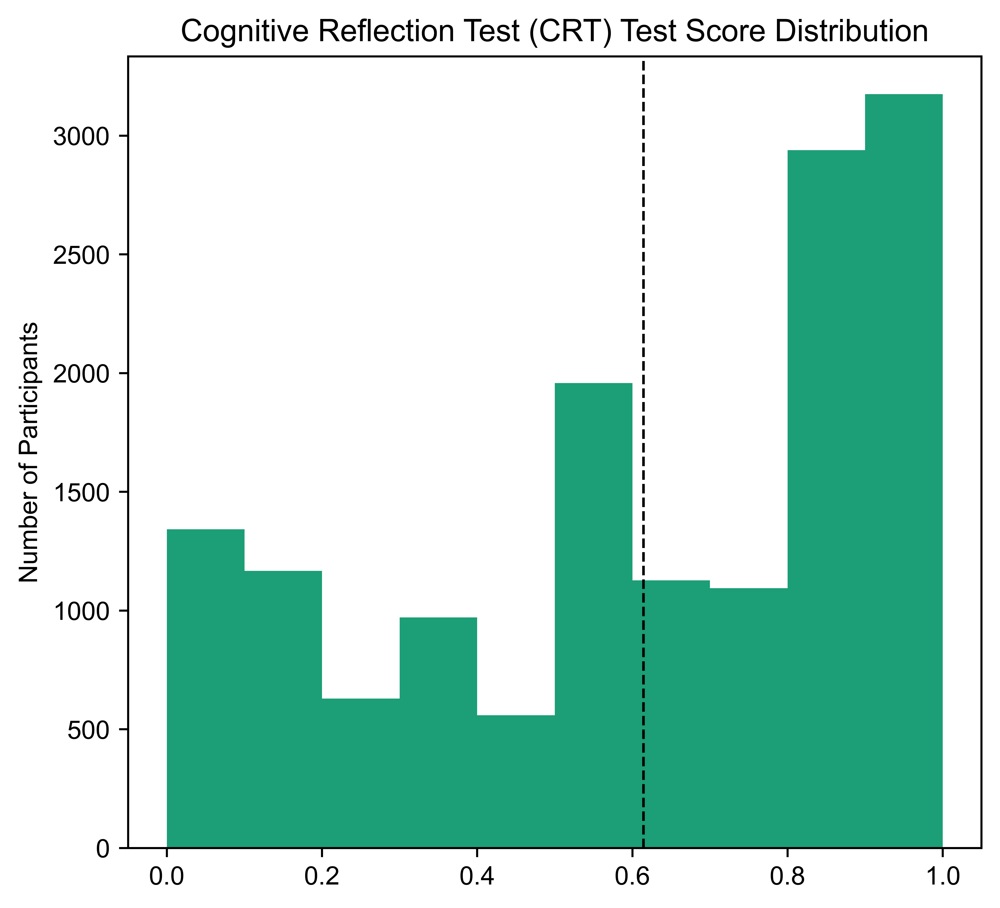

In [30]:
plot_histograms(individual_workers_by_stageId, ["CRT"], ["Cognitive Reflection Test (CRT) Test Score Distribution"], fig_path = "../../outputs/figures/crt_distribution.png")

In [31]:
individual_workers_by_stageId["CRT"].describe()

count    14961.000000
mean         0.614141
std          0.324043
min          0.000000
25%          0.333333
50%          0.666667
75%          0.857143
max          1.000000
Name: CRT, dtype: float64

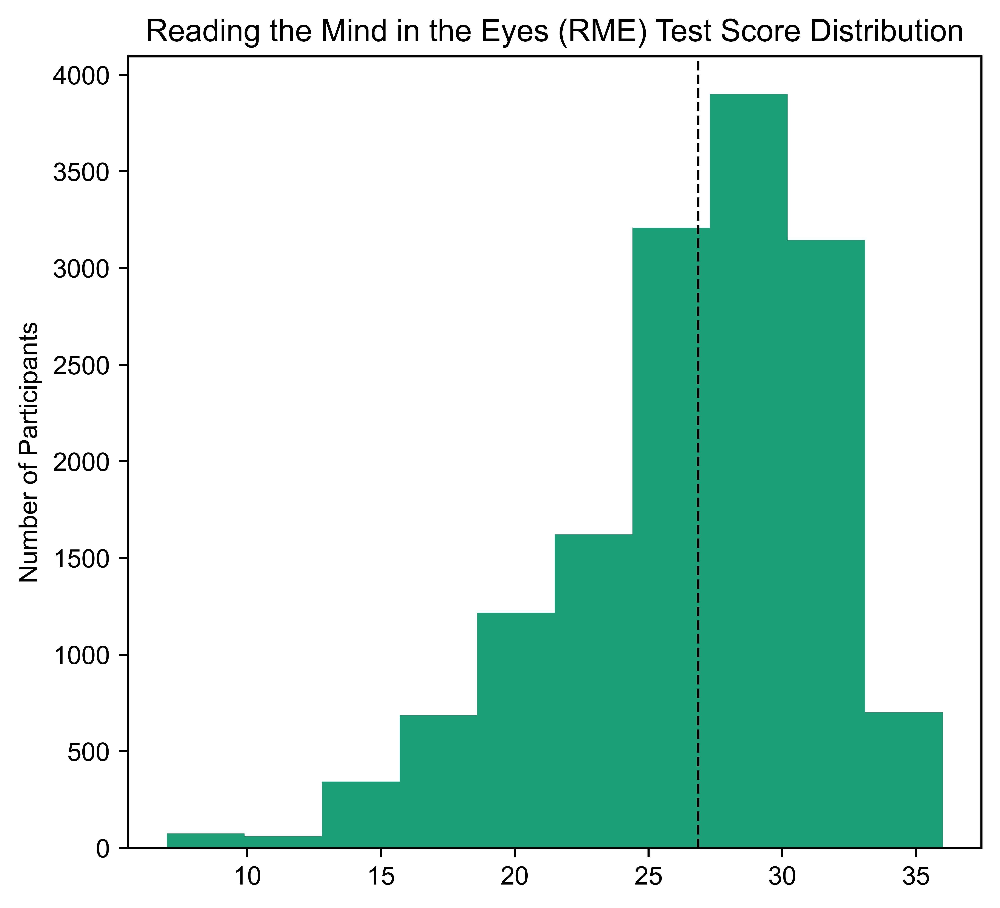

In [32]:
plot_histograms(individual_workers_by_stageId, ["RME"], ["Reading the Mind in the Eyes (RME) Test Score Distribution"], fig_path = "../../outputs/figures/rme_distribution.png")

In [33]:
individual_workers_by_stageId["RME"].describe()

count    14961.000000
mean        26.848072
std          5.095267
min          7.000000
25%         24.000000
50%         28.000000
75%         31.000000
max         36.000000
Name: RME, dtype: float64

In [34]:
ircs_cols = [col for col in DEMOGRAPHIC_COLS if "IRCS" in col]

In [35]:
ircs_name_mapping = {
	'IRCS_GS': 'Group Self (GS)',
	'IRCS_GV': 'Group Value (GV)',
	'IRCS_IB': 'Indivivdual Agency (IB)',
	'IRCS_IV': 'Individual Value (IV)',
	'IRCS_RS': 'Relational Self (RS)',
	'IRCS_IR': 'Individual Self (IS)'
}

In [36]:
plot_histograms(individual_workers_by_stageId, ircs_cols, [ircs_name_mapping[name] for name in ircs_cols], fig_path = "../../outputs/figures/ircs_distribution.png")

In [37]:
demgraphics_mapping = {
 'birth_year' : "Birth Year",
 'education_level': "Education Level",
 'income_max': "Income",
 'political_fiscal': "Political: Fiscal Views",
 'political_social': "Political: Social Views",
 'political_party': "Political: Party Affiliation",
 'gender': "Gender",
 'race': "Race",
 'marital_status': "Marital Status"
}

In [38]:
individual_workers_by_stageId[demographics].describe()

,birth_year,income_max,political_fiscal,political_social
count,14961.000000,14110.000000,14961.000000,14961.000000
mean,1977.964040,64631.608646,0.553138,0.489219
std,12.595063,40731.942093,0.248446,0.246368
min,1943.000000,10000.000000,0.200000,0.166667
25%,1970.000000,29999.000000,0.400000,0.200000
50%,1980.000000,49999.000000,0.600000,0.400000
75%,1987.000000,99999.000000,0.800000,0.600000
max,2001.000000,149999.000000,1.000000,1.000000


In [39]:
individual_workers_by_stageId["gender"].value_counts()["Male"]/individual_workers_by_stageId["gender"].value_counts().sum()

np.float64(0.5528373771806697)

In [40]:
individual_workers_by_stageId["gender"].value_counts()["Female"]/individual_workers_by_stageId["gender"].value_counts().sum()

np.float64(0.43914176859835574)

In [41]:
individual_workers_by_stageId["race"].value_counts()["White"]/individual_workers_by_stageId["race"].value_counts().sum()

np.float64(0.7233665257127267)

In [42]:
plot_histograms(individual_workers_by_stageId, demographics, [demgraphics_mapping[name] for name in demographics], fig_path = "../../outputs/figures/demographics_distribution.png")